## Setting the Input and Output Folder

In [46]:
# Setting the output folder where all the results would be stored
outputFolder = '/home/baker/my-scratch-share/James_Bagnall_Single_cell_rna_seq_BWA_mem_Feature_Count/output/'

# inputFolder : Folder name with all the fastq files
intputFolder = '/home/baker/my-James-Bagnall-share/fastqs/'

In [1]:
import subprocess, os, csv, signal, pysam, collections, optparse, sys, tempfile, re, optparse
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import rpy2.interactive as r
import rpy2.interactive.packages # this can take few seconds
import time
#from ZIFA import ZIFA
#from ZIFA import block_ZIFA
import pylab

In [2]:
%load_ext rpy2.ipython

In [4]:
%%R
library("dplyr")
library("edgeR")
library("ggplot2")
library("cowplot")
library("BASiCS")
library("scde")
library(repr)
library(biomaRt)
library(GO.db)
library(extRemes)
library(Lmoments)
library(distillery)
library(car)
theme_set(theme_bw(base_size = 16))

__We had to use the raw data for this as SCDE does not accept normalized data__

In [5]:
%%R
#cdSCDE <- read.csv('/home/baker/my-scratch-share/James_Bagnall_Single_cell_rna_seq_V3/output/GeneAnnotationIdName.csv',check.names=FALSE,row.names=1)
CountData <- read.table('AllHtseqCounts.tsv',header=TRUE, sep='\t', row.names=1)
ERCCData <- read.table('AllERCC_Counts.tsv',header=TRUE, sep='\t', row.names=1)
CellNumber <- dim(CountData)[2]

In [6]:
%%R
dim(CountData)

[1] 45237    96


We used the clean.counts() method from SCDE to filter the cells and genes. However, the detault parameter filtered out too much of the cells and so we had to chage it

clean.counts(counts, min.lib.size = 1800, min.reads = 10,
  min.detected = 5)
  
Arguments

| Parameters | Description |
|----------|:-------------|
| counts |  read count matrix. The rows correspond to genes, columns correspond to individual cells |
| min.lib.size |    Minimum number of genes detected in a cell. Cells with fewer genes will be removed (default: 1.8e3) |
| min.reads | Minimum number of reads per gene. Genes with fewer reads will be removed (default: 10) |
| min.detected | Minimum number of cells a gene must be seen in. Genes not seen in a sufficient number of cells will be removed (default: 5) |

We changed the `min.lib.size` to `1500`. This gives 57 cells. 

In [7]:
%%R -o cd
# omit the non-mapped gene information
cd = CountData[1:(dim(CountData)[1]-5),]
# cd = CountData
# omit genes that are never detected
 #cd <- cd[rowSums(cd[,2:dim(cd)[2]])>0, ]
# omit cells with very poor coverage
 #cd <- cd[, colSums(cd[,2:dim(cd)[2]])>1e4]
CellNumber <- dim(cd)[2]
 #GeneNames <- cbind(rownames(cd), as.character(cd[,1]))
 #colnames(GeneNames) <- c("EnsembleID", "GeneName")
 #cd$gene_name <- NULL
 #print(head(GeneNames[,1]))
cd <- clean.counts(cd, min.lib.size=1500)
dim(cd)

[1] 7789   80


In [10]:
%%R
## calculate mean
reads_mean     <- apply(cd, 1, mean)
ERCC_mean <- apply(ERCCData, 1, mean)
distribution <- data.frame(reads_mean, ERCC_mean)

#reads_filter_mean <- apply(reads_filter, 1, mean)
#molecules_filter_mean <- apply(molecules_filter, 1, mean)
#distribution_filter <- data.frame(reads_filter_mean, molecules_filter_mean)

## correlation between reads and molecules
cor(distribution)


Error in data.frame(reads_mean, ERCC_mean) : 
  arguments imply differing number of rows: 7789, 84


/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: Error in data.frame(reads_mean, ERCC_mean) : 
  arguments imply differing number of rows: 7789, 84

  res = super(Function, self).__call__(*new_args, **new_kwargs)
/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: In addition: 
  res = super(Function, self).__call__(*new_args, **new_kwargs)
/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: There were 50 or more warnings (use warnings() to see the first 50)
  res = super(Function, self).__call__(*new_args, **new_kwargs)


In [8]:
%%R
print(colnames(cd))
colSums(cd)

 [1] "C01" "C02" "C03" "C04" "C05" "C06" "C07" "C08" "C09" "C11" "C12" "C13"
[13] "C14" "C15" "C16" "C17" "C18" "C21" "C22" "C23" "C25" "C26" "C27" "C28"
[25] "C29" "C31" "C32" "C34" "C35" "C37" "C39" "C40" "C41" "C42" "C43" "C44"
[37] "C45" "C46" "C47" "C48" "C49" "C50" "C51" "C52" "C53" "C54" "C55" "C56"
[49] "C58" "C60" "C61" "C62" "C63" "C64" "C65" "C66" "C67" "C68" "C69" "C70"
[61] "C71" "C72" "C74" "C76" "C77" "C78" "C80" "C81" "C82" "C83" "C85" "C86"
[73] "C87" "C88" "C91" "C92" "C93" "C94" "C95" "C96"
   C01    C02    C03    C04    C05    C06    C07    C08    C09    C11    C12 
 63515 117330  38625  55377  48839  77667  51203  52762  30446  35069  56165 
   C13    C14    C15    C16    C17    C18    C21    C22    C23    C25    C26 
 63984 126798  72652  39987  92840  37501  40164  35875 131602  92967  63398 
   C27    C28    C29    C31    C32    C34    C35    C37    C39    C40    C41 
 31607  27971  24981  23100  64122  38550  31903  33160  42417  75456  32327 
   C42    C43    

In [61]:
%%R
rownames(cd) <- gsub("\\..*","",rownames(cd))
head(rownames(cd))

[1] "ENSMUSG00000000001" "ENSMUSG00000000028" "ENSMUSG00000000056"
[4] "ENSMUSG00000000078" "ENSMUSG00000000085" "ENSMUSG00000000088"


In [17]:
%%R
GeneNames[,1] <- gsub("\\..*","",GeneNames[,1])
GeneNamesList <- split(GeneNames, rep(1:ncol(GeneNames), each = nrow(GeneNames)))


Error in gsub("\\..*", "", GeneNames[, 1]) : 
  error in evaluating the argument 'x' in selecting a method for function 'gsub': Error: object 'GeneNames' not found


/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: Error in gsub("\\..*", "", GeneNames[, 1]) : 
  error in evaluating the argument 'x' in selecting a method for function 'gsub': Error: object 'GeneNames' not found

  res = super(Function, self).__call__(*new_args, **new_kwargs)


In [62]:
%%R
knn <- knn.error.models(cd, k = ncol(cd)/4, n.cores = 2, min.count.threshold = 1, min.nonfailed = 5, save.model.plots = TRUE, max.model.plots = 50)

In [63]:
%%R
head(knn)

       conc.b     conc.a    fail.r    corr.b corr.a corr.theta corr.ltheta.b
C01 35.723737 -11.221636 -2.302585 -3.078940      1  0.2577139   -52.9367685
C02 28.974777  -9.102232 -2.302585 -2.416656      1  0.2632640    -0.8098582
C03 36.704180 -11.508584 -2.302585 -3.396357      1  0.2121883    -2.8037914
C04 20.244289  -6.898720 -2.302585 -2.892168      1  0.2087600     0.9086674
C05  9.952068  -3.361089 -2.302585 -3.146540      1  0.2031256    -1.3949459
C06 25.303136  -8.327079 -2.302585 -2.714999      1  0.2547135    -0.5300832
    corr.ltheta.t corr.ltheta.m corr.ltheta.s corr.ltheta.r   conc.a2
C01     20.645196      9.633814    -0.0227803     0.5191253 0.9004274
C02      2.000877      9.294619    -0.4640948    20.0000000 0.7310661
C03      2.240386      5.416800    -0.7183989     0.1811224 0.9066966
C04      1.778554      5.731204  -100.0000000    20.0000000 0.5927944
C05      1.763283      5.846961    -2.1597925     0.1000000 0.2909221
C06      2.399533      9.340954    -0.392

In [21]:
%%R
knnWithERCC <- knn.error.models(ERCCCounts, k = ncol(Counts)/4, n.cores = 2, min.count.threshold = 1, min.nonfailed = 5, save.model.plots = TRUE, max.model.plots = 50)


Error in lapply(counts, is.integer) : object 'ERCCCounts' not found


/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: Error in lapply(counts, is.integer) : object 'ERCCCounts' not found

  res = super(Function, self).__call__(*new_args, **new_kwargs)


The fitting process above wrote out `cell.models.pdf` file in the current directory showing model fits for the first 50 cells

### Normalizing variance
In order to accurately quantify excess variance or overdispersion, we must normalize out expected levels of technical and intrinsic biological noise. Briefly, variance of the NB/Poisson mixture processes derived from the error modeling step are modeled as a chi-squared distribution using adjusted degrees of freedom and observation weights based on the drop-out probability of a given gene. Here, we normalize variance, trimming 3 most extreme cells and limiting maximum adjusted variance to 5.

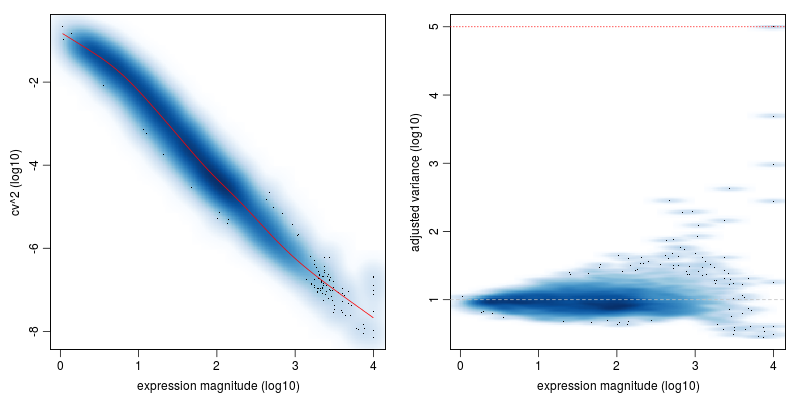

In [64]:
%%R -w 800 -h 400
varinfo <- pagoda.varnorm(knn, counts = cd, trim = 3/ncol(cd), max.adj.var = 5, n.cores = 2, plot = TRUE)

The plot on the left shows coefficient of variance squared (on log10 scale) as a function of expression magnitude (log10 FPM). The red line shows local regression model for the genome-wide average dependency. The plot on the right shows adjusted variance (derived based on chi-squared probability of observed/genomewide expected ratio for each gene, with degrees of freedom adjusted for each gene). The adjusted variance of 1 means that a given gene exhibits as much variance as expected for a gene of such population average expression magnitude. Genes with high adjusted variance are overdispersed within the measured population and most likely show subpopulation-specific expression:

__Using ERCC spike ins to fit dependency between expression magnitude and variance__

checking counts ... done
Winsorizing count matrix ... done
checking batch ... ok
calculating modes ... prior . done
calculating weight matrix ... calculating ... done
calculating effective degrees of freedom ... done
calculating normalized expression values ... . done


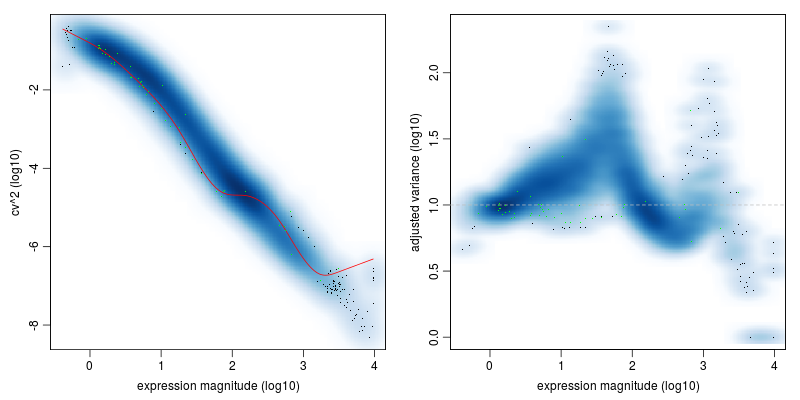

In [388]:
%%R -w 800 -h 400
ercc.genes <- grep("^ERCC-",rownames(Counts),value=T)
varinfo <- pagoda.varnorm(knnWithERCC, counts = Counts, trim = 3/ncol(Counts), fit.genes=ercc.genes,n.cores=2,plot=T,verbose=1,max.adj.var=5)

__Now fitting model with only read counts__

As the ERCC spike in data were not conclusive, here I am running the error model fitting from SCDE with only the read counts. The fitting process relies on a subset of robust genes that are detected in multiple cross-cell comparisons. 

Note this step takes a considerable amount of time unless multiple cores are used.

In [ ]:
%%R
# calculate models
#o.ifm <- scde.error.models(counts = cd, n.cores = 2, threshold.segmentation = TRUE, save.crossfit.plots = FALSE, save.model.plots = TRUE, verbose = 1)

/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: cross-fitting 4371 pairs:

  res = super(Function, self).__call__(*new_args, **new_kwargs)
/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: adjusting library size based on 2000 entries

  res = super(Function, self).__call__(*new_args, **new_kwargs)


In [65]:
%%R
# list top overdispersed genes
sort(varinfo$arv, decreasing = TRUE)[1:10]

ENSMUSG00000065037 ENSMUSG00000091405 ENSMUSG00000064337 ENSMUSG00000064351 
          5.000000           5.000000           3.691582           2.977690 
ENSMUSG00000053560 ENSMUSG00000023348 ENSMUSG00000064339 ENSMUSG00000018930 
          2.626691           2.451841           2.445528           2.288166 
ENSMUSG00000067017 ENSMUSG00000069515 
          2.280549           2.160809 


### Controlling for sequencing depth

Even with all the corrections, sequencing depth or gene coverage is typically still a major aspects of variability. In most studies, we would want to control for that as a technical artifact (exceptions are cell mixtures where subtypes significantly differ in the amount of total mRNA). Below we will control for the gene coverage (estimated as a number of genes with non-zero magnitude per cell) and normalize out that aspect of cell heterogeneity:

In [66]:
%%R
varinfo <- pagoda.subtract.aspect(varinfo, colSums(cd[, rownames(knn)]>0))

In [67]:
%%R
head(varinfo$arv)

ENSMUSG00000000001 ENSMUSG00000000028 ENSMUSG00000000056 ENSMUSG00000000078 
         1.1273046          0.9800717          0.8533333          0.9901898 
ENSMUSG00000000085 ENSMUSG00000000088 
         1.0148273          0.7580282 


### Evaluate overdispersion of pre-defined gene sets

In order to detect significant aspects of heterogeneity across the population of single cells, 'pagoda' identifies pathways and gene sets that exhibit statistically significant excess of coordinated variability. Specifically, for each gene set, we tested whether the amount of variance explained by the first principal component significantly exceed the background expectation. 

__ Using Ensembl's BioMart service to get the GO annotations__

In [68]:
%%R
# Initialize the connection to the Ensembl BioMart Service
# Available datasets can be listed with 
# listDatasets(useMart("ensembl"))
# Use mmusculus_gene_ensembl for mouse
# For mouse symbols we can use "mgi_symbol"
ensembl = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

# Constructs a dataframe with two columns: hgnc_symbol and go_id
# If rownames are Ensembl IDs, use ensembl_gene_id as filter value
#go = getBM(attributes = c("ensembl_gene_id", "go_id"), filters = "ensembl_gene_id", values = gsub("\\.[0-9]+", "", rownames(cd)), mart = ensembl)
go = getBM(attributes = c("ensembl_gene_id", "go_id"), filters = "ensembl_gene_id", values = rownames(cd), mart = ensembl)
#go = getBM(attributes = c("ensembl_gene_id", "go_id"), mart = ensembl)

# Use the GO.db library to add a column with the GO-term to the dataframe
go$term = Term(go$go_id)

# Create a named list of character vectors out of the df
s = split(go$ensembl_gene_id, paste(go$go_id,go$term))

# Saves the list as a R environment
go.env = list2env(s)

In [381]:
%%R
# Saving the GO terms with Gene names
GOAnnotated <- cbind(go$ensembl_gene_id,go$go_id,go$term)
write.csv(GOAnnotated, "/home/baker/my-scratch-share/James_Bagnall_Single_cell_rna_seq_V3/output/GOAnnotated.csv", row.names=T)

In [70]:
%%R
head(ls(go.env)) # Look at gene set names

[1] "GO:0000002 mitochondrial genome maintenance"                  
[2] "GO:0000003 reproduction"                                      
[3] "GO:0000010 trans-hexaprenyltranstransferase activity"         
[4] "GO:0000011 vacuole inheritance"                               
[5] "GO:0000012 single strand break repair"                        
[6] "GO:0000014 single-stranded DNA endodeoxyribonuclease activity"


In [71]:
%%R
head(get(ls(go.env)[1], go.env)) # Look at one gene set

[1] "ENSMUSG00000019699" "ENSMUSG00000041064" "ENSMUSG00000038084"
[4] "ENSMUSG00000022889"


In [72]:
%%R
ngenes <- unlist(lapply(as.list(go.env),function(x) sum(x %in% rownames(varinfo$mat))))
head(ngenes)

                                          GO:0005768 endosome 
                                                          112 
                    GO:0050901 leukocyte tethering or rolling 
                                                            7 
                                    GO:0019900 kinase binding 
                                                           33 
GO:0004515 nicotinate-nucleotide adenylyltransferase activity 
                                                            1 
    GO:0005290 L-histidine transmembrane transporter activity 
                                                            1 
       GO:0015234 thiamine transmembrane transporter activity 
                                                            1 


Now, we can calculate weighted first principal component magnitudes for each GO gene set in the provided environment.

In [73]:
%%R
pwpca <- pagoda.pathway.wPCA(varinfo, go.env, n.components = 1, n.cores = 2, verbose=TRUE)

/usr/local/lib/python2.7/dist-packages/rpy2/robjects/functions.py:106: UserWarning: processing 1383 valid pathways

  res = super(Function, self).__call__(*new_args, **new_kwargs)


In [32]:
%%R
pwpca

$`GO:0000027 ribosomal large subunit assembly`
$`GO:0000027 ribosomal large subunit assembly`$xv
     C01 C02 C03 C04 C05 C06 C07 C08 C11 C12 C14 C15 C17 C18 C21 C22 C23 C25
[1,]   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
     C26 C27 C32 C34 C35 C37 C39 C40 C41 C42 C43 C44 C45 C46 C47 C48 C49 C50
[1,]   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
     C51 C52 C53 C54 C55 C56 C58 C60 C61 C62 C63 C64 C65 C66 C67 C68 C69 C70
[1,]   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
     C71 C72 C74 C76 C77 C78 C81 C82 C83 C85 C86 C87 C88 C91 C92 C93 C94 C95
[1,]   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0

$`GO:0000027 ribosomal large subunit assembly`$xp
$`GO:0000027 ribosomal large subunit assembly`$xp$rotation
                           PC1
ENSMUSG00000004100  0.04353525
ENSMUSG00000022247 -0.15658229
ENSMUSG00000028187  0.19625930
ENSMUSG00000029066 -0.21365966
ENSMUSG00000029614 -0.

We can now evaluate the statistical significance of the observed overdispersion for each GO gene set.

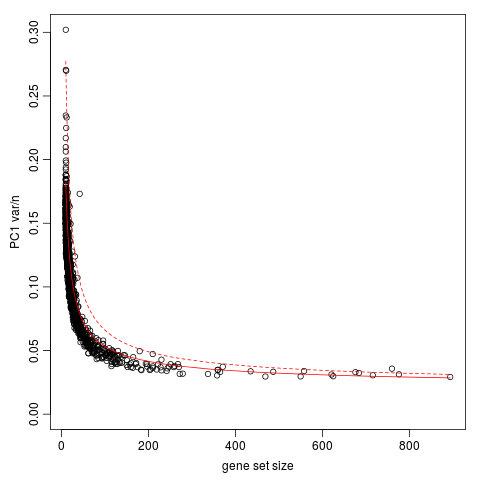

In [74]:
%%R
df <- pagoda.top.aspects(pwpca, return.table = TRUE, plot = TRUE, z.score = 1.96)

Each point on the plot shows the PC1 variance (lambda1) magnitude (normalized by set size) as a function of set size. The red lines show expected (solid) and 95% upper bound (dashed) magnitudes based on the Tracey-Widom model.

In [75]:
%%R
head(df,40)

The history saving thread hit an unexpected error (OperationalError('database is locked',)).History will not be written to the database.


                                                 name npc   n    score
53                              GO:0000786 nucleosome   1  42 2.193088
513                     GO:0008009 chemokine activity   1  10 1.658589
1274  GO:0070098 chemokine-mediated signaling pathway   1  11 1.576950
145                    GO:0002548 monocyte chemotaxis   1  10 1.485573
1306 GO:0071346 cellular response to interferon-gamma   1  12 1.440879
23             GO:0000183 chromatin silencing at rDNA   1  31 1.340573
1076                   GO:0044822 poly(A) RNA binding   1 760 1.215626
247                    GO:0005615 extracellular space   1 210 1.155487
237                            GO:0005524 ATP binding   1 676 1.094608
             z     adj.z sh.z adj.sh.z
53   11.495296 10.853157   NA       NA
513   4.486089  3.022356   NA       NA
1274  4.910504  3.527954   NA       NA
145   3.864478  2.231305   NA       NA
1306  3.732368  2.080530   NA       NA
23    3.900519  2.231305   NA       NA
1076  7.169007  6

- The z column gives the Z-score of pathway over-dispersion relative to the genome-wide model (Z-score of 1.96 corresponds to P-value of 5%, etc.).
- "z.adj" column shows the Z-score adjusted for multiple hypothesis (using Benjamini-Hochberg correction).
- "score" gives observed/expected variance ratio
- "sh.z" and "adj.sh.z" columns give the raw and adjusted Z-scores of "pathway cohesion", which compares the observed PC1 magnitude to the magnitudes obtained when the observations for each gene are randomized with respect to cells. When such Z-score is high (e.g. for GO:0008009) then multiple genes within the pathway contribute to the coordinated pattern.


## Evaluate overdispersion of 'de novo' gene sets

We can also test 'de novo' gene sets whose expression profiles are well-correlated within the given dataset. The following procedure will determine 'de novo' gene clusters in the data, and build a background model for the expectation of the gene cluster weighted principal component magnitudes. Note the higher trim values for the clusters, as we want to avoid clusters that are formed by outlier cells.



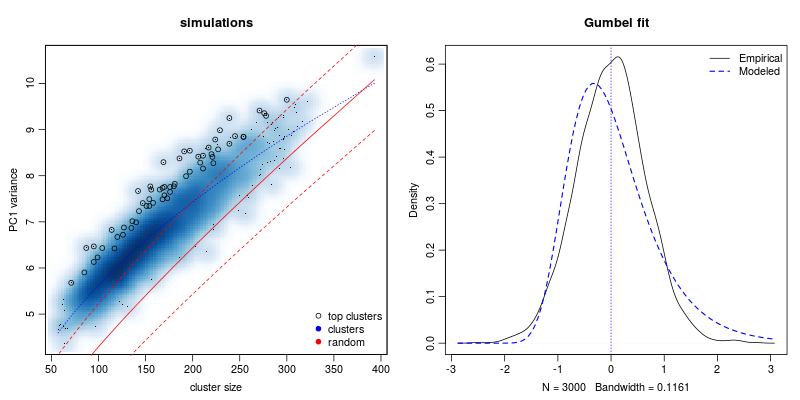

In [76]:
%%R -w 800 -h 400
library(extRemes)
library(Lmoments)
library(distillery)
library(car)

clpca <- pagoda.gene.clusters(varinfo, trim = 7.1/ncol(varinfo$mat), n.clusters = 50, n.cores = 2, plot = TRUE)

The plot above shows background distribution of the first principal component (PC1) variance (lambda1) magnitude. The blue scatterplot on the left shows lambda1 magnitude vs. cluster size for clusters determined based on randomly-generated matrices of the same size. The black circles show top cluster in each simulation. The red lines show expected magnitude and 95% confidence interval based on Tracy-Widom distribution. The right plot shows extreme value distribution fit of residual cluster PC1 variance magnitude relative to the Gumbel (extreme value) distribution.

Now the set of top aspects can be recalculated taking these de novo gene clusters into account:

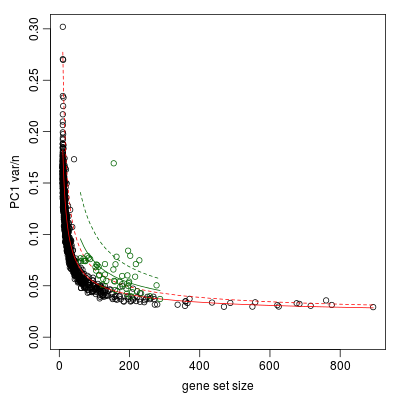

In [77]:
%%R -w 400 -h 400
df <- pagoda.top.aspects(pwpca, clpca, return.table = TRUE, plot = TRUE, z.score = 1.96)
write.table(df, "/home/baker/my-scratch-share/James_Bagnall_Single_cell_rna_seq_V3/output/BASiCS_OUTPUT/TopAspects.txt", quote = FALSE,
            sep = "\t", col.names = NA)

The gene clusters and their corresponding model expected value and 95% upper bound are shown in green.

## Visualize significant aspects of heterogeneity

To view top heterogeneity aspects, we will first obtain information on all the significant aspects of transcriptional heterogeneity. We will also determine the overall cell clustering based on this full information:

In [78]:
%%R
# get full info on the top aspects
tam <- pagoda.top.aspects(pwpca, clpca, n.cells = NULL, z.score = qnorm(0.01/2, lower.tail = FALSE))
# determine overall cell clustering
hc <- pagoda.cluster.cells(tam, varinfo)

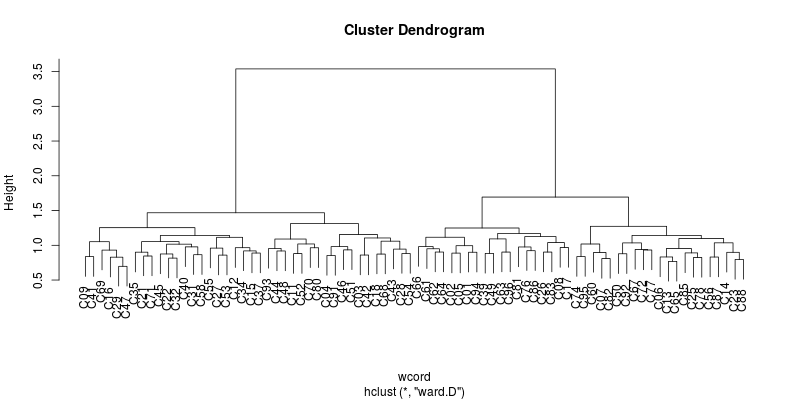

In [79]:
%%R -w 800 -h 400
plot(hc)

Next, we will reduce redundant aspects in two steps. First we will combine pathways that are driven by the same sets of genes:

In [80]:
%%R
tamr <- pagoda.reduce.loading.redundancy(tam, pwpca, clpca)

In the second step we will combine aspects that show similar patterns (i.e. separate the same sets of cells). Here we will plot the cells using the overall cell clustering determined above:

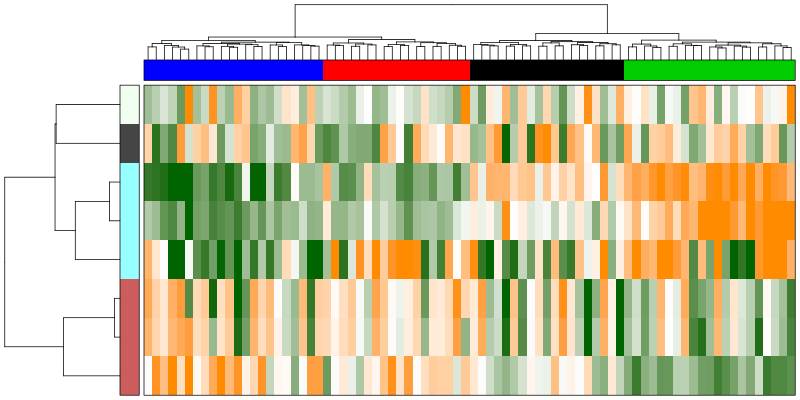

In [81]:
%%R -w 800 -h 400
tamr2 <- pagoda.reduce.redundancy(tamr, distance.threshold = 0.9, plot = TRUE, cell.clustering = hc, labRow = NA, labCol = NA, box = TRUE, margins = c(0.5, 0.5), trim = 0, col.cols = rbind(groups = cutree(hc, 4)))

In the plot above, the columns are cells, rows are different significant aspects, clustered by their similarity pattern.The green-to-orange color scheme shows low-to-high weighted PCA scores (aspect patterns), where generally orange indicates higher expression. Blocks of color on the left margin show which aspects have been combined by the command above. Here the number of resulting aspects is relatively small. "top" argument (i.e. top = 10) can be used to limit further analysis to top N aspects.

We will view the top aspects, clustering them by pattern similarity (note, to view aspects in the order of increasing `lambda1` magnitude, use `row.clustering = NA`).

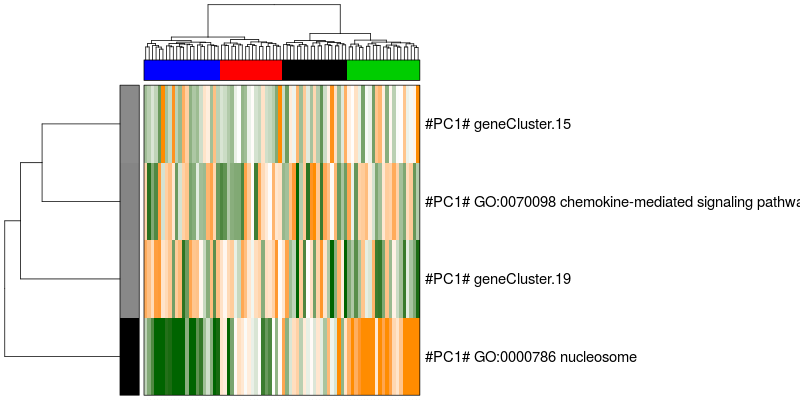

In [82]:
%%R -w 800 -h 400
pagoda.view.aspects(tamr2, cell.clustering = hc, box = TRUE, labCol = hc, margins = c(0.5, 40), col.cols = rbind(groups = cutree(hc, 4)))

In [83]:
%%R
getwd()
#save.image()

[1] "/home/baker/Rna-seq_Data-Analysis/Pawel_Pascaz"


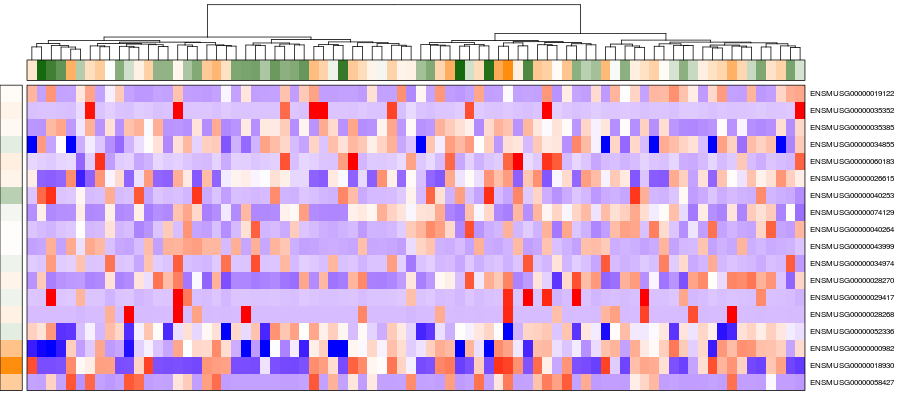

In [84]:
%%R -w 900 -h 400
test<- pagoda.show.pathways(c("GO:0071346 cellular response to interferon-gamma","GO:0070098 chemokine-mediated signaling pathway"), varinfo, go.env, cell.clustering = hc, margins = c(1,10), show.cell.dendrogram = TRUE, showRowLabels = TRUE, showPC = TRUE)

In [85]:
%%R
save(list = ls(all.names = TRUE), file = "JamesHeterogeneityData.RData", envir = .GlobalEnv)

In [146]:
%%R
# compile a browsable app, showing top three clusters with the top color bar
app <- make.pagoda.app(tamr2, tam, varinfo, go.env, pwpca, clpca, col.cols = col.cols, cell.clustering = hc, title = "NPCs")
# show app in the browser (port 1468)
show.app(app, "James_Cluster", browse = TRUE, port = 1468) 

Server started on 127.0.0.1:1468
[1] RookTest      http://127.0.0.1:1468/custom/RookTest
[2] pollen        http://127.0.0.1:1468/custom/pollen
[3] James_Cluster http://127.0.0.1:1468/custom/James_Cluster

Call browse() with an index number or name to run an application.
